$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [14]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [15]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/galkesten/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/galkesten/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/galkesten/.pytorch-datasets/lfw/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [18]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


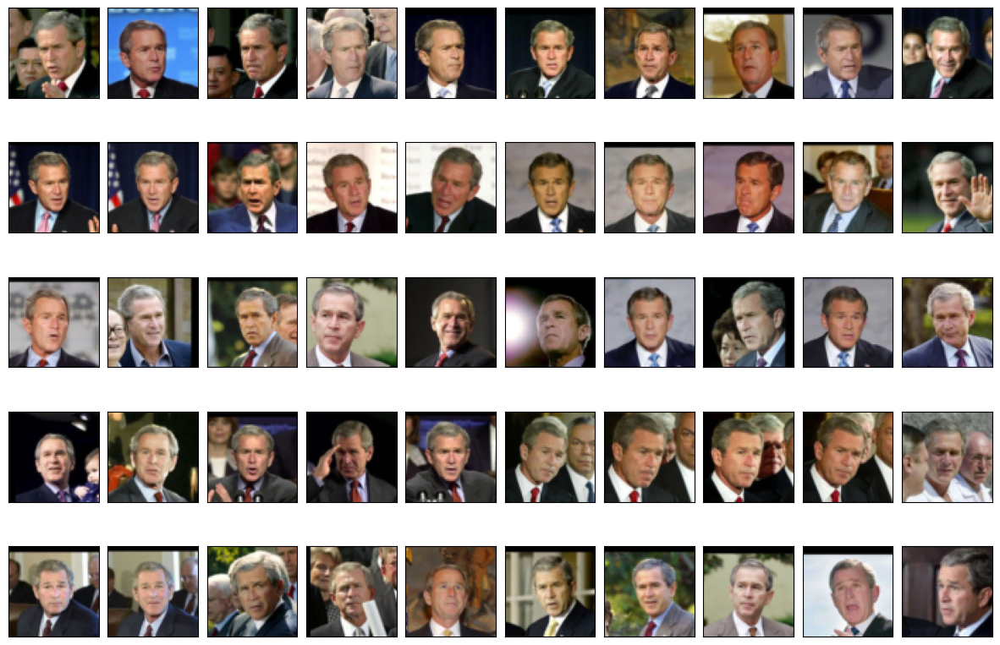

In [19]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): EncoderCNN(
    (cnn): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (fc): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Lin

**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
import hw3.gan as gan
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (initial): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv): DecoderCNN(
    (cnn): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(64, 3, kernel_size=(4, 4

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

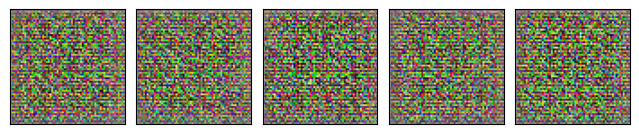

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [20]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 128, 'z_dim': 100, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'data_label': 1, 'label_noise': 0.0}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.02it/s]
Discriminator loss: 1.138138437271118
Generator loss:     6.597881221771241
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


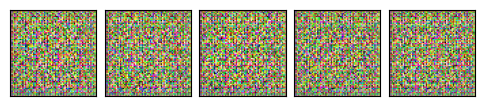

--- EPOCH 2/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.30278177559375763
Generator loss:     8.641816902160645


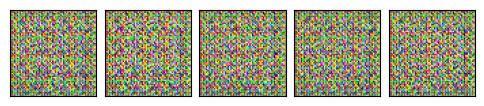

--- EPOCH 3/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.95it/s]
Discriminator loss: 0.22865643203258515
Generator loss:     11.588402557373048


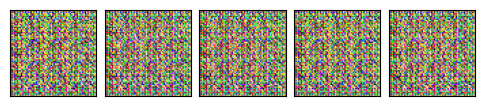

--- EPOCH 4/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.83it/s]
Discriminator loss: 0.1993977963924408
Generator loss:     15.044457817077637


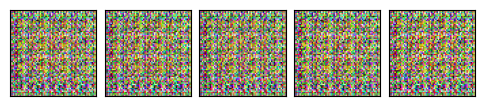

--- EPOCH 5/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.19it/s]
Discriminator loss: 0.5636604484170675
Generator loss:     20.500583744049074


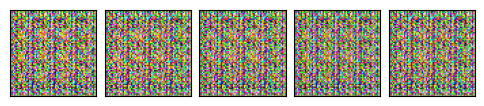

--- EPOCH 6/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.07it/s]
Discriminator loss: 0.5476142702624202
Generator loss:     21.006225109100342


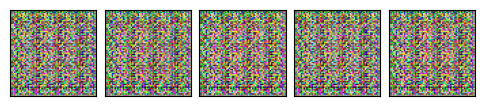

--- EPOCH 7/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.76it/s]
Discriminator loss: 0.6538148932158947
Generator loss:     22.215963745117186


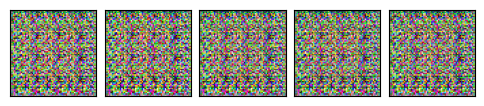

--- EPOCH 8/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 0.3728753957897425
Generator loss:     15.054035568237305


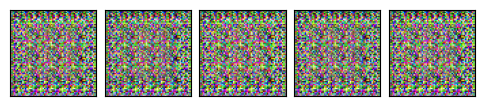

--- EPOCH 9/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.11989627368748187
Generator loss:     19.73428430557251


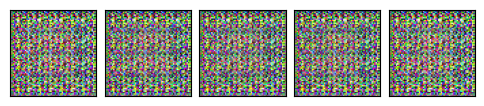

--- EPOCH 10/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.00it/s]
Discriminator loss: 0.6059169445186854
Generator loss:     26.802501678466797


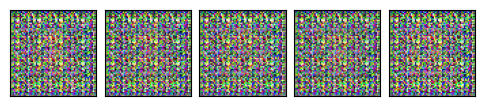

--- EPOCH 11/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.18it/s]
Discriminator loss: 0.2356358123011887
Generator loss:     15.963140869140625


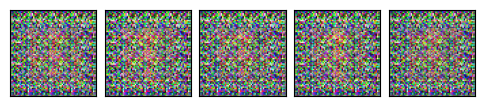

--- EPOCH 12/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.10it/s]
Discriminator loss: 0.38897788766771557
Generator loss:     21.390494728088377


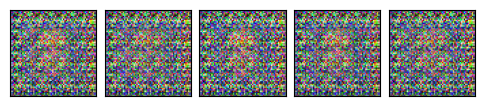

--- EPOCH 13/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 0.775340136885643
Generator loss:     24.37394618988037


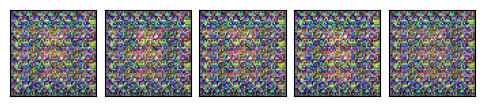

--- EPOCH 14/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.5066809447482228
Generator loss:     19.329719924926756


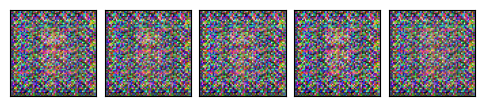

--- EPOCH 15/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.03it/s]
Discriminator loss: 0.6728002279996872
Generator loss:     23.621990203857422


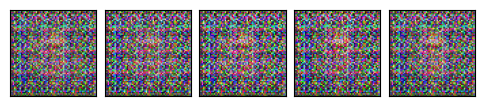

--- EPOCH 16/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.13it/s]
Discriminator loss: 0.4606920011341572
Generator loss:     21.654327964782716


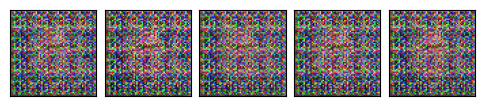

--- EPOCH 17/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 1.2487611025571823
Generator loss:     23.45891523361206


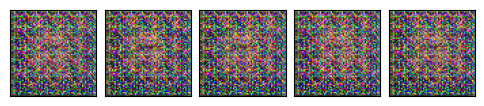

--- EPOCH 18/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.17it/s]
Discriminator loss: 0.3974704843014479
Generator loss:     18.425801277160645


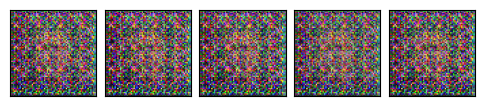

--- EPOCH 19/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.11it/s]
Discriminator loss: 0.23393386118113996
Generator loss:     21.03643856048584


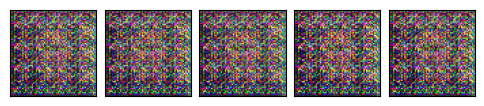

--- EPOCH 20/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.86it/s]
Discriminator loss: 0.6753155784681439
Generator loss:     23.444893646240235


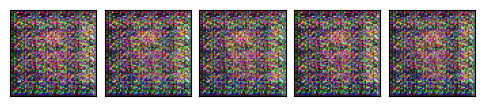

--- EPOCH 21/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.95it/s]
Discriminator loss: 1.4281734704971314
Generator loss:     25.083475875854493


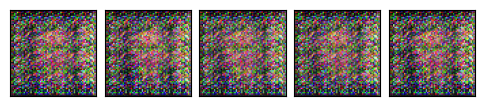

--- EPOCH 22/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.11it/s]
Discriminator loss: 1.132361136097461
Generator loss:     22.24917154312134


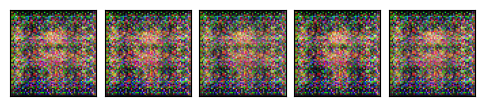

--- EPOCH 23/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.6356332547962665
Generator loss:     19.885102462768554


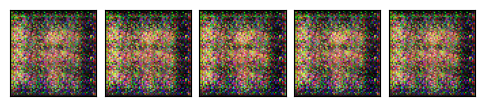

--- EPOCH 24/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 2.610296306014061
Generator loss:     15.452124500274659


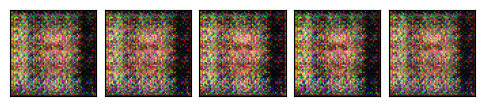

--- EPOCH 25/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.4789316475391388
Generator loss:     13.7361083984375


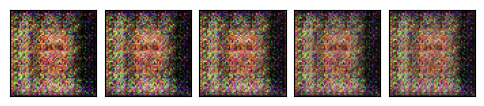

--- EPOCH 26/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.5419698566198349
Generator loss:     11.527342796325684


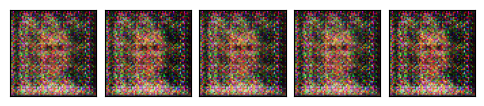

--- EPOCH 27/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.12it/s]
Discriminator loss: 1.8038824290037154
Generator loss:     19.48170385360718


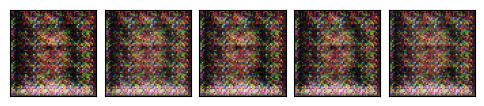

--- EPOCH 28/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.11it/s]
Discriminator loss: 0.31156146973371507
Generator loss:     15.7738862991333


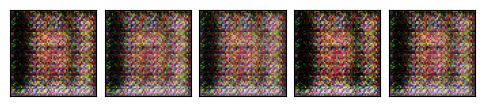

--- EPOCH 29/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.7063695266842842
Generator loss:     17.276993083953858


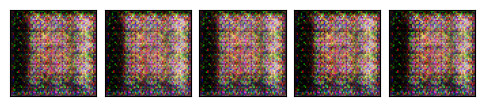

--- EPOCH 30/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.7010094970464706
Generator loss:     14.301806831359864


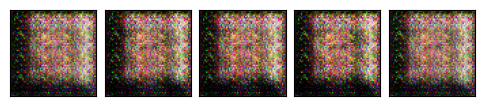

--- EPOCH 31/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.02it/s]
Discriminator loss: 0.34363211542367933
Generator loss:     12.449595260620118


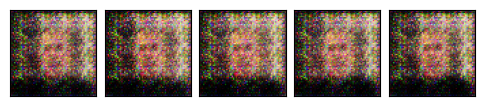

--- EPOCH 32/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 0.7909018039703369
Generator loss:     13.187480545043945


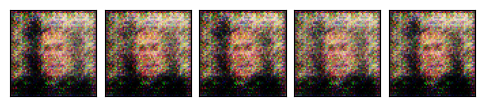

--- EPOCH 33/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.06it/s]
Discriminator loss: 0.8033108055591583
Generator loss:     11.38987865447998


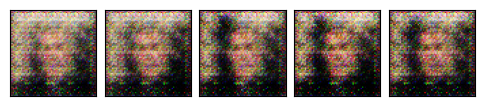

--- EPOCH 34/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.5719135463237762
Generator loss:     7.962751293182373


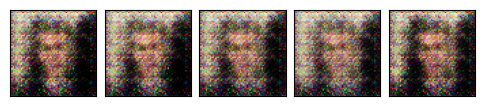

--- EPOCH 35/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.16it/s]
Discriminator loss: 0.402699226140976
Generator loss:     7.2712178230285645


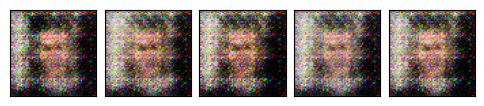

--- EPOCH 36/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.13it/s]
Discriminator loss: 1.8327662587165832
Generator loss:     14.542298126220704


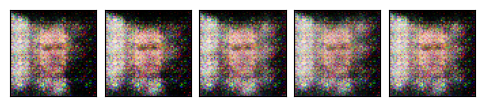

--- EPOCH 37/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.88it/s]
Discriminator loss: 0.7148754596710205
Generator loss:     9.652909088134766


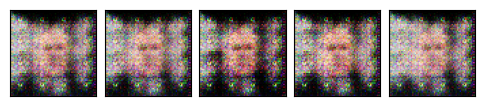

--- EPOCH 38/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 1.112196671962738
Generator loss:     8.542609119415284


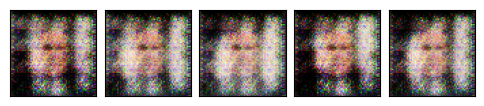

--- EPOCH 39/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.04it/s]
Discriminator loss: 1.1710681080818177
Generator loss:     7.241236019134521


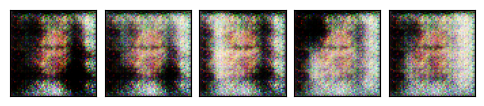

--- EPOCH 40/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.93it/s]
Discriminator loss: 0.8687145948410034
Generator loss:     5.113602876663208
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


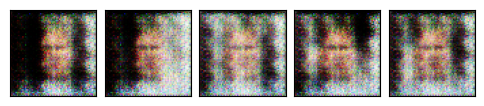

--- EPOCH 41/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.07it/s]
Discriminator loss: 0.7577559351921082
Generator loss:     5.198518228530884


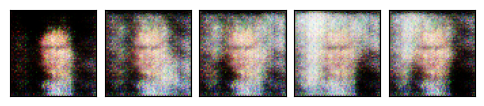

--- EPOCH 42/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.10it/s]
Discriminator loss: 2.1800256848335264
Generator loss:     4.577012592554093
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


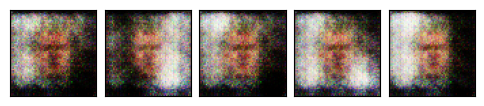

--- EPOCH 43/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.92it/s]
Discriminator loss: 1.4000123977661132
Generator loss:     3.1936264276504516
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


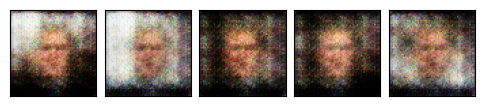

--- EPOCH 44/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.96it/s]
Discriminator loss: 0.9404105901718139
Generator loss:     3.635344910621643


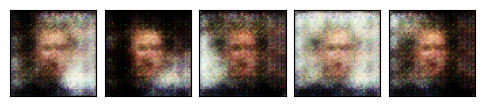

--- EPOCH 45/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.10it/s]
Discriminator loss: 0.9373652219772339
Generator loss:     2.750344443321228
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


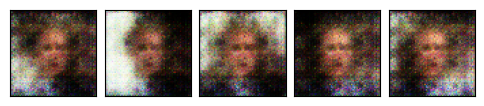

--- EPOCH 46/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.16it/s]
Discriminator loss: 1.117738699913025
Generator loss:     3.788221263885498


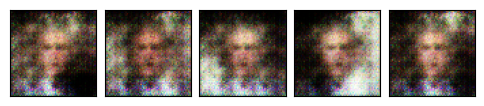

--- EPOCH 47/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.80it/s]
Discriminator loss: 0.6192787528038025
Generator loss:     3.284450578689575


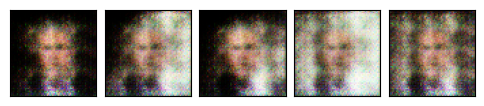

--- EPOCH 48/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 1.447016704082489
Generator loss:     3.685220503807068


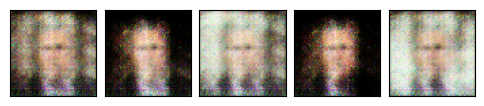

--- EPOCH 49/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 0.515300840139389
Generator loss:     3.02931752204895


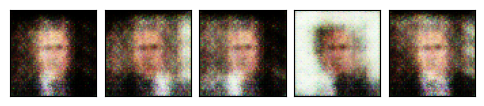

--- EPOCH 50/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.05it/s]
Discriminator loss: 1.0441563487052918
Generator loss:     3.757671022415161


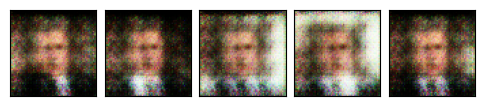

--- EPOCH 51/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.05it/s]
Discriminator loss: 0.5384660124778747
Generator loss:     3.118762159347534


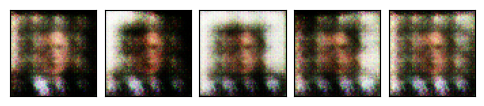

--- EPOCH 52/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.8914859294891357
Generator loss:     4.1820916652679445


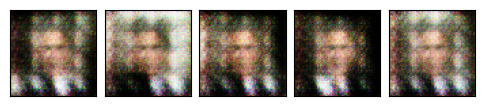

--- EPOCH 53/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.7189716339111328
Generator loss:     4.936088180541992


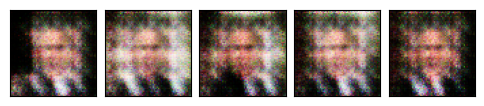

--- EPOCH 54/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.54it/s]
Discriminator loss: 1.1145783245563508
Generator loss:     3.901989698410034


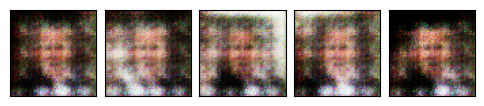

--- EPOCH 55/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.98it/s]
Discriminator loss: 0.6006658852100373
Generator loss:     4.6379231929779055


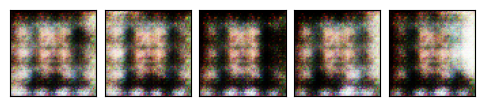

--- EPOCH 56/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.12it/s]
Discriminator loss: 0.44897077679634095
Generator loss:     4.346741771697998


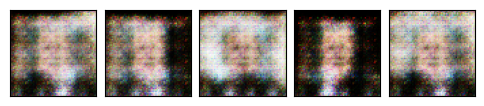

--- EPOCH 57/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 0.5789020359516144
Generator loss:     4.419371175765991


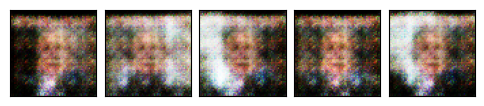

--- EPOCH 58/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.91it/s]
Discriminator loss: 0.6518270373344421
Generator loss:     4.4913732528686525


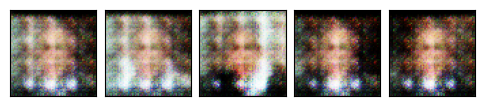

--- EPOCH 59/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 0.7173659205436707
Generator loss:     4.998994493484497


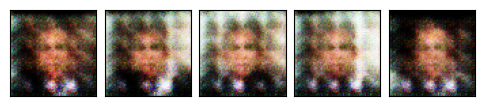

--- EPOCH 60/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.09it/s]
Discriminator loss: 0.38363252878189086
Generator loss:     3.98083233833313


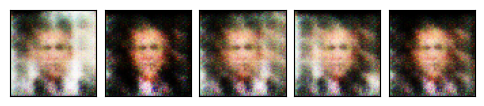

--- EPOCH 61/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.05it/s]
Discriminator loss: 0.5272397756576538
Generator loss:     4.799342679977417


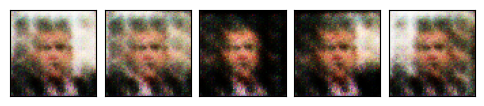

--- EPOCH 62/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.13it/s]
Discriminator loss: 0.6877258241176605
Generator loss:     3.909862923622131


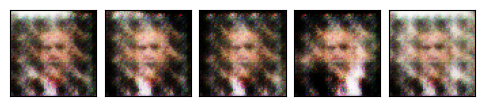

--- EPOCH 63/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.98it/s]
Discriminator loss: 1.2127554059028625
Generator loss:     5.118530511856079


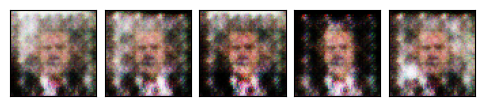

--- EPOCH 64/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.04it/s]
Discriminator loss: 0.41344529390335083
Generator loss:     4.780700969696045


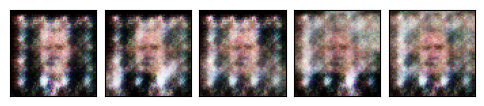

--- EPOCH 65/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.10it/s]
Discriminator loss: 0.6620850056409836
Generator loss:     5.698985385894775


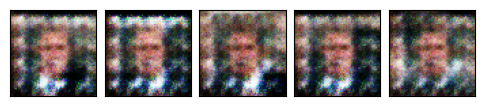

--- EPOCH 66/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.09it/s]
Discriminator loss: 0.355704602599144
Generator loss:     5.5350090026855465


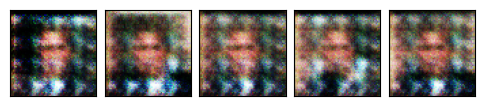

--- EPOCH 67/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 0.4828314006328583
Generator loss:     5.296454620361328


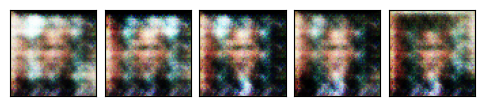

--- EPOCH 68/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.5482345044612884
Generator loss:     6.024021053314209


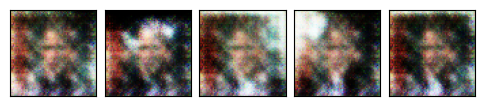

--- EPOCH 69/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.01it/s]
Discriminator loss: 0.4463558912277222
Generator loss:     4.920499610900879


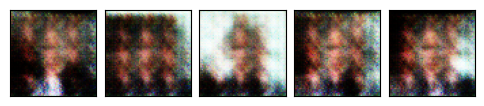

--- EPOCH 70/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 1.490920627117157
Generator loss:     4.801488065719605


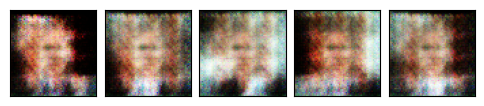

--- EPOCH 71/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.03it/s]
Discriminator loss: 1.7050386428833009
Generator loss:     6.061249113082885


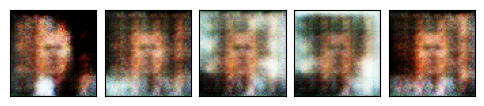

--- EPOCH 72/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:02<00:00,  2.47it/s]
Discriminator loss: 0.8189159274101258
Generator loss:     3.2861109018325805


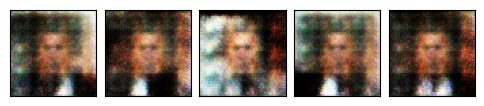

--- EPOCH 73/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.99it/s]
Discriminator loss: 0.9556044578552246
Generator loss:     4.883663940429687


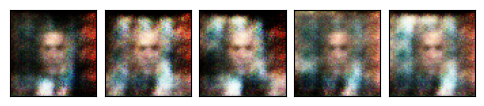

--- EPOCH 74/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.07it/s]
Discriminator loss: 0.5146440148353577
Generator loss:     4.660430145263672


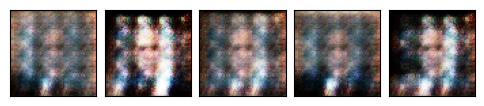

--- EPOCH 75/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.12it/s]
Discriminator loss: 0.3733127176761627
Generator loss:     5.265089416503907


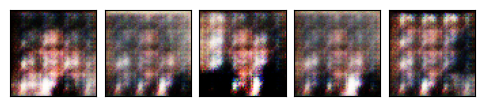

--- EPOCH 76/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.17it/s]
Discriminator loss: 0.42268632650375365
Generator loss:     5.139281940460205


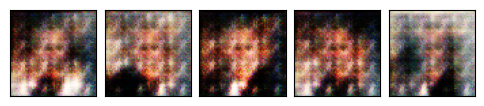

--- EPOCH 77/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.01it/s]
Discriminator loss: 1.6202359616756439
Generator loss:     5.928851795196533


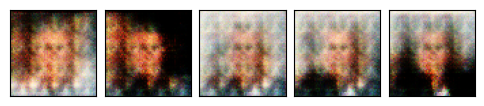

--- EPOCH 78/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.11it/s]
Discriminator loss: 0.8343851566314697
Generator loss:     4.433534097671509


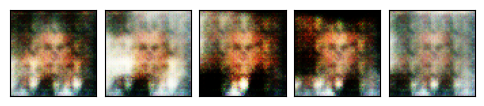

--- EPOCH 79/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.07it/s]
Discriminator loss: 0.4853832244873047
Generator loss:     3.5820353031158447


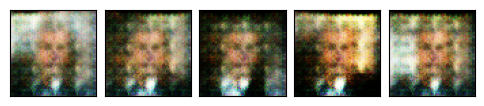

--- EPOCH 80/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.18it/s]
Discriminator loss: 0.6384703040122985
Generator loss:     4.431017255783081


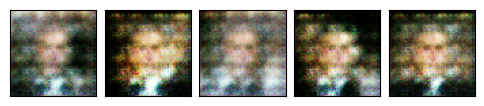

--- EPOCH 81/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.18it/s]
Discriminator loss: 0.5345114946365357
Generator loss:     4.485584497451782


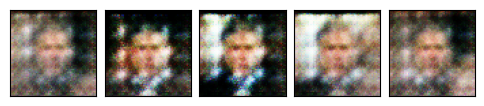

--- EPOCH 82/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 0.9760761559009552
Generator loss:     5.53922061920166


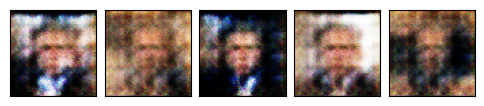

--- EPOCH 83/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.17it/s]
Discriminator loss: 0.5881007969379425
Generator loss:     4.076919317245483


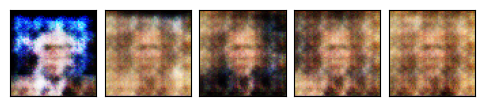

--- EPOCH 84/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 0.5617140829563141
Generator loss:     3.5392906427383424


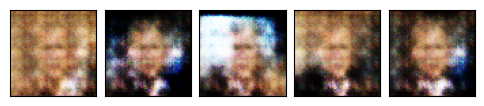

--- EPOCH 85/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.10it/s]
Discriminator loss: 0.4868683636188507
Generator loss:     5.324571418762207


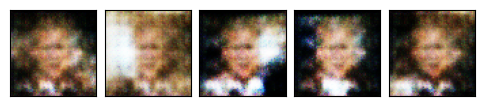

--- EPOCH 86/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.18it/s]
Discriminator loss: 0.9188889682292938
Generator loss:     4.056018173694611


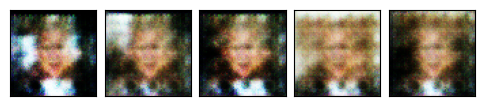

--- EPOCH 87/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.97it/s]
Discriminator loss: 1.3726154804229735
Generator loss:     5.401557922363281


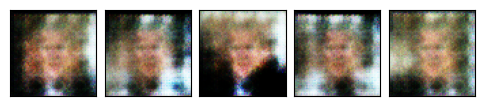

--- EPOCH 88/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.99it/s]
Discriminator loss: 0.4583986461162567
Generator loss:     3.974725341796875


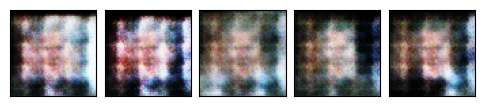

--- EPOCH 89/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.17it/s]
Discriminator loss: 0.5062880575656891
Generator loss:     5.416964054107666


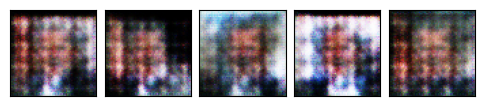

--- EPOCH 90/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 0.8304615259170532
Generator loss:     4.807929229736328


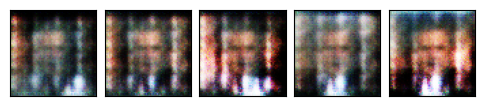

--- EPOCH 91/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.20it/s]
Discriminator loss: 0.30483843088150026
Generator loss:     4.67584719657898


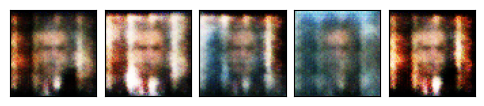

--- EPOCH 92/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 0.440918093919754
Generator loss:     4.585992670059204


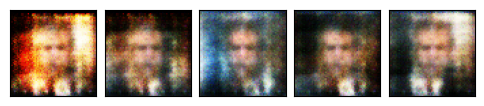

--- EPOCH 93/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.15it/s]
Discriminator loss: 0.5912897199392319
Generator loss:     4.8591817855834964


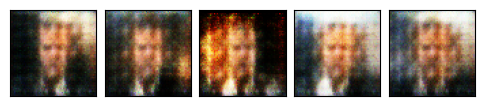

--- EPOCH 94/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.14it/s]
Discriminator loss: 1.0222744286060332
Generator loss:     4.952310276031494


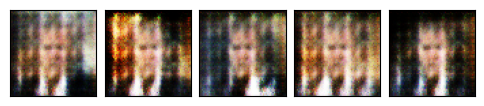

--- EPOCH 95/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.11it/s]
Discriminator loss: 0.5515490353107453
Generator loss:     4.550601148605347


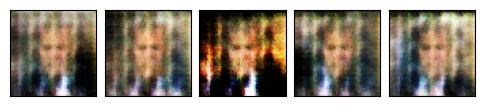

--- EPOCH 96/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.08it/s]
Discriminator loss: 0.9187856018543243
Generator loss:     5.225596952438354


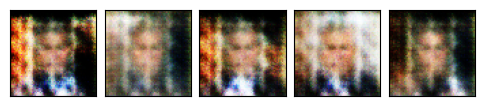

--- EPOCH 97/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.19it/s]
Discriminator loss: 0.5348065227270127
Generator loss:     4.3543267250061035


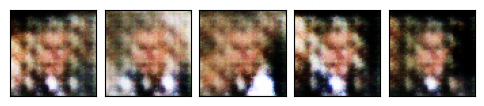

--- EPOCH 98/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.13it/s]
Discriminator loss: 0.512295663356781
Generator loss:     4.358769321441651


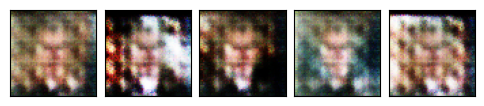

--- EPOCH 99/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.21it/s]
Discriminator loss: 0.3947629451751709
Generator loss:     4.02432165145874


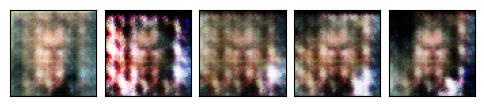

--- EPOCH 100/100 ---
100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.20it/s]
Discriminator loss: 0.29053446650505066
Generator loss:     4.390424108505249


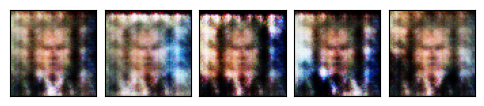

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

In [13]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

*** Images Generated from best model:


AttributeError: 'collections.OrderedDict' object has no attribute 'sample'

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [ ]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [ ]:
display_answer(hw3.answers.part2_q1)

### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [ ]:
display_answer(hw3.answers.part2_q2)

### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [ ]:
display_answer(hw3.answers.part2_q3)